## Máquinas de soporte vectorial (SVM)

Es un algoritmo de aprendizaje supervisado donde el objetivo es maximizar el margen definido por la distancia entre el hiperplano de separación y los puntos (de los datos de entrenamiento) más cercanas al hiperplano. Estos puntos son denominados _vectores soporte_.

La idea que hay detrás de las SVM de _margen máximo_ consiste en seleccionar el hiperplano separador que está a la misma distancia de los puntos más cercanos de cada clase. 
<pre>  
<center><img src="https://drive.google.com/uc?export=view&id=16Fk78bbxSnCTNLsLE3LPvAVQzSq3s-PT"></center>
</pre>

Las SVM tienen en su implementación una variable de holgura _C_ que permite que las restricciones no se cumplan de manera estricta. Esto es necesario en el caso de conjuntos que no son linealmente separables.
<pre>  
<center><img src="https://drive.google.com/uc?export=view&id=1bC72kprifClSNMjFp01KgXq4TxjSC_Vx"></center>
</pre>


## 📁
A continuación vamos a usar las SVM con algunos datasets guardados en la carpeta data

In [1]:
# importamos las librerías necesarias
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.io as sio
from sklearn.preprocessing import StandardScaler

### Dataset Nº 1

In [4]:
# Dataset data1.mat
archivo_mat = sio.loadmat('data/data1.mat')
#archivo_matlab
X = archivo_mat['X']
y = archivo_mat['y'].flatten()
#y.shape

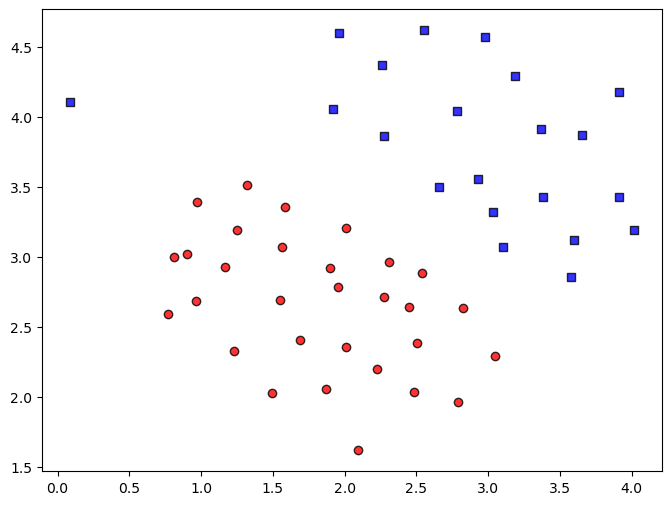

In [5]:
# Visualizamos los datos
markers = ('o', 's', '^', 'v')
colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
plt.figure(figsize=(8,6))
for idx, cl in enumerate(np.unique(y)):
    plt.scatter(x=X[y == cl, 0], 
                y=X[y == cl, 1],
                alpha=0.8, 
                c=colors[idx],
                marker=markers[idx], 
                label=cl, 
                edgecolor='black')
plt.show()

Este dataset es linealmente separable. Notar que se tiene un outlier en una de las clases. 

Parte de este ejercicio es probar con diferentes valores del parámetro C y ver qué efecto tiene la presencia del outlier en la región de separación. 

In [6]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def plot_decision_regions(X, y, clasificador, test_idx=None, resolution=0.02):
    
    # setup marker generator and color map
    markers = ('s', 'o', '^', 'v', 'x')
    colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # plot the decision surface
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1

    
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                           np.arange(x2_min, x2_max, resolution))
    
    Z = clasificador.predict(np.array([xx1.ravel(), xx2.ravel()]).T)

    Z = Z.reshape(xx1.shape)

    plt.contourf(xx1, xx2, Z, alpha=0.3, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], 
                    y=X[y == cl, 1],
                    alpha=0.8, 
                    c=colors[idx],
                    marker=markers[idx], 
                    label=cl, 
                    edgecolor='black')

    # highlight test samples
    if test_idx:
        # plot all samples
        X_test, y_test = X[test_idx, :], y[test_idx]

        plt.scatter(X_test[:, 0],
                    X_test[:, 1],
                    c="None",
                    edgecolor='black',
                    alpha=1,
                    linewidth=1,
                    marker='o',
                    s=100, 
                    label='test set')

In [7]:
# Normalización de los datos
sc = StandardScaler()
sc.fit(X)                     
X_std = sc.transform(X) 

Utilice la clase [**SVC**](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html) para entrenar una máquina de soporte vectorial con kernel lineal y separar los datos.

Pruebe con distintos valores del **parámetro 'C'**. Qué puede observar al cambiar este valor? **Pruebe valores de C entre 1 y 150**

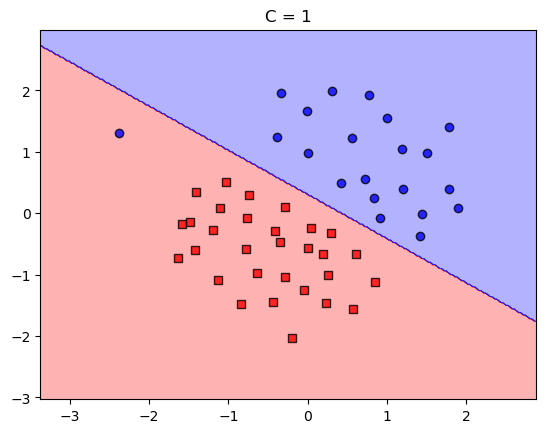

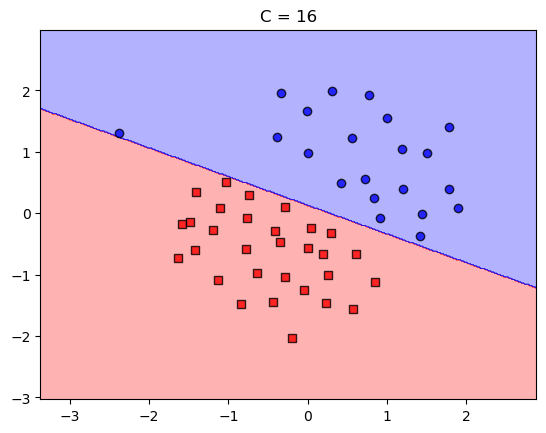

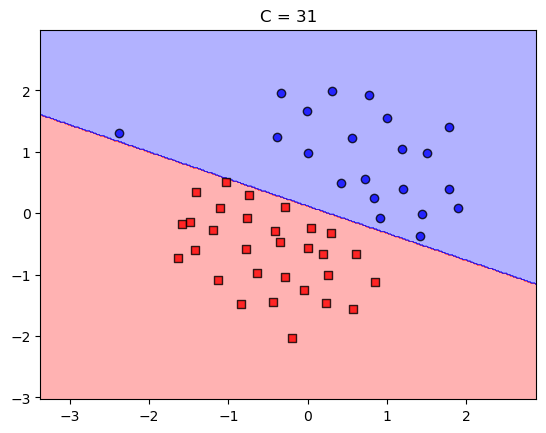

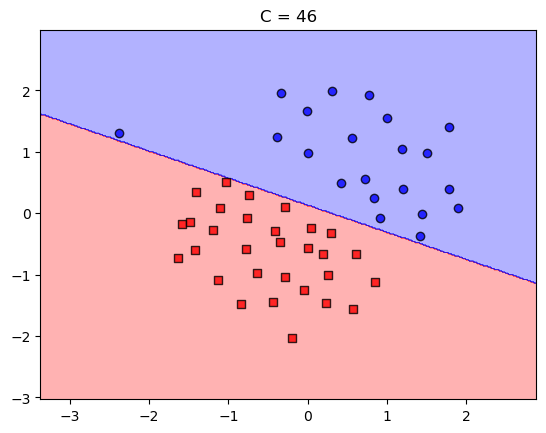

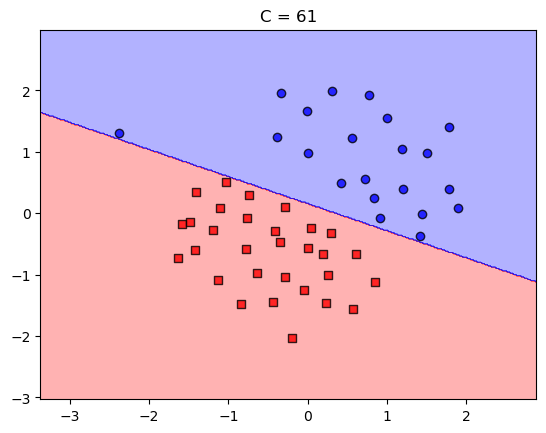

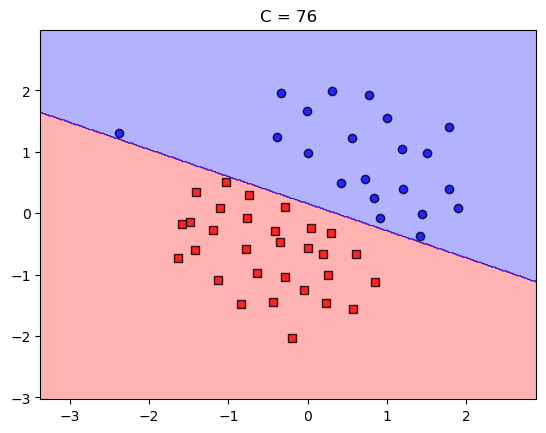

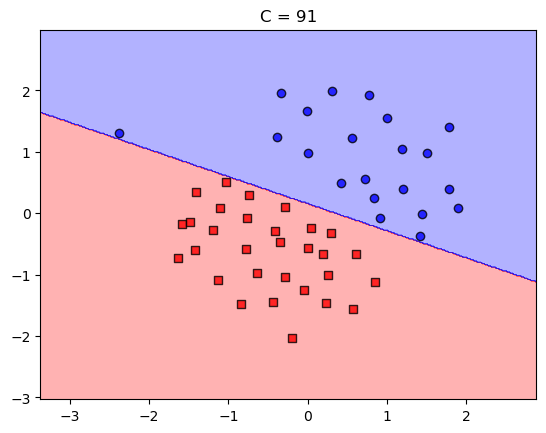

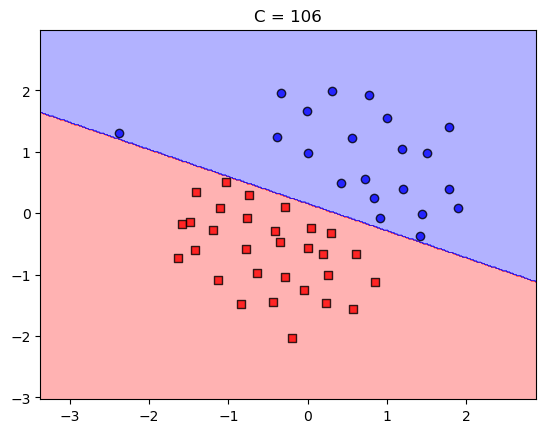

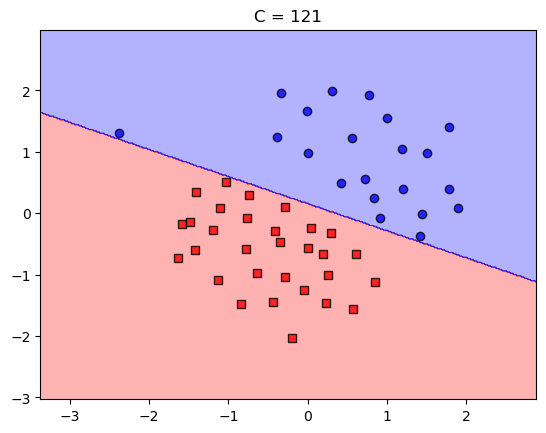

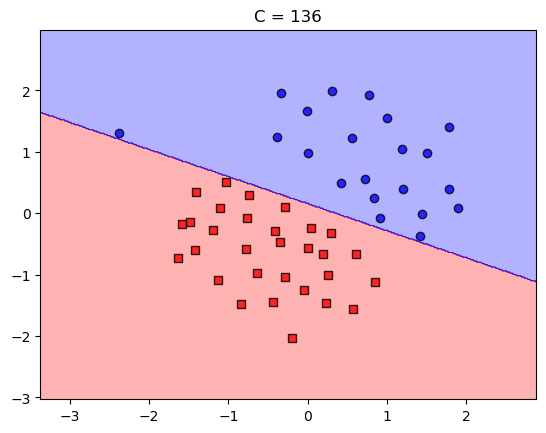

In [28]:
from sklearn.svm import SVC
from sklearn.metrics import r2_score
#------------------------------------------
c = np.arange(1, 150, 15)
scores = []
for i in c:
    svm1 = SVC(C=i, kernel='linear')
    svm1.fit(X_std, y)
    y_svc = svm1.predict(X_std)
    scores.append(f"Para C = {i}, R² = {r2_score(y, y_svc)}")
    plot_decision_regions(X_std, y, clasificador=svm1)
    plt.title(f"C = {i}")
    plt.show()
#---------------------------------------------




In [29]:
for i in scores:
    print(i)

Para C = 1, R² = 0.919047619047619
Para C = 16, R² = 1.0
Para C = 31, R² = 1.0
Para C = 46, R² = 1.0
Para C = 61, R² = 1.0
Para C = 76, R² = 1.0
Para C = 91, R² = 1.0
Para C = 106, R² = 1.0
Para C = 121, R² = 1.0
Para C = 136, R² = 1.0


### Dataset Nº 2
### SVM con kernel Gaussiano

In [45]:
# Dataset data2.mat
archivo_mat_2 = sio.loadmat('data/data2.mat')
X_2 = archivo_mat_2['X']
y_2 = archivo_mat_2['y'].flatten()
X_2.shape

(863, 2)

/tmp/ipykernel_3157/1445450755.py:6: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(x=X_2[y_2 == cl, 0],


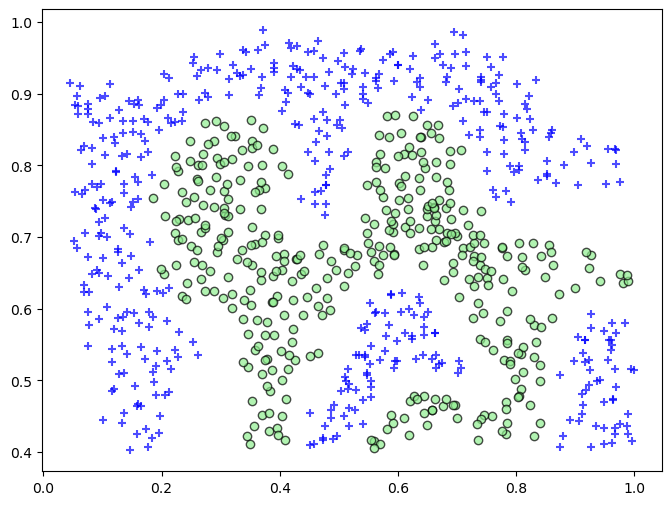

In [46]:
# Visualizamos los datos
markers = ('o', '+', 's', '^', 'v')
colors = ('lightgreen', 'blue', 'salmon','skyblue','red', 'gray', 'cyan')
plt.figure(figsize=(8,6))
for idx, cl in enumerate(np.unique(y_2)):
    plt.scatter(x=X_2[y_2 == cl, 0], 
                y=X_2[y_2 == cl, 1],
                alpha=0.7, 
                c=colors[idx],
                marker=markers[idx], 
                label=cl, 
                edgecolor='black')

Como verá de la gráfica, los datos no son linealmente separables. Con el kernel Gaussiano, el algoritmo del SVM podrá encontrar la región de decisión capaz de separar los datos correctamente y seguir los contornos del dataset.

In [47]:
sc = StandardScaler()
sc.fit(X_2)                     
X_2_std = sc.transform(X_2) 

Uno de los _kernels_ más utilizado es el __radial basis function__ (RBF), que se conoce como __kernel Gaussiano__.

Use la documentación para utilizar un modelo **kernel Gaussiano**. Modifique los **parámetros C y gamma**. Qué observa al cambiar estos valores? **Pruebe valores de C entre 1 y 150 y entre 1 a 50 para gamma**.

El parámetro gamma de la función, es un parámetro que indica cuánta influencia tiene una sola muestra, haciendo que el límite de decisión se ajuste mucho más a las muestras.

La idea principal detrás del uso de _kernels_ con datos que no son linealmente separables, es crear combinaciones no lineales de las características originales y proyectarlas en un espacio de mayor dimensión (mapeo mediante una función), donde los datos se vuelven linealmente separables 

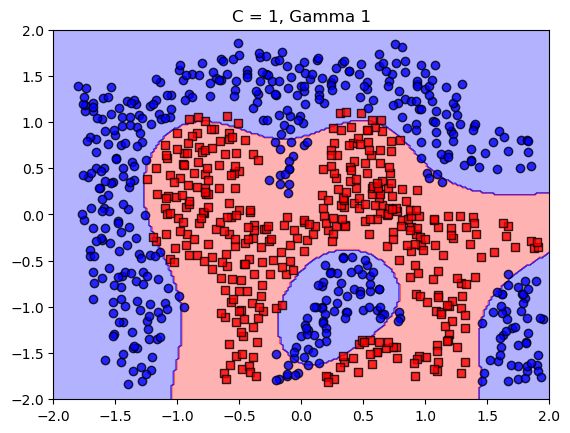

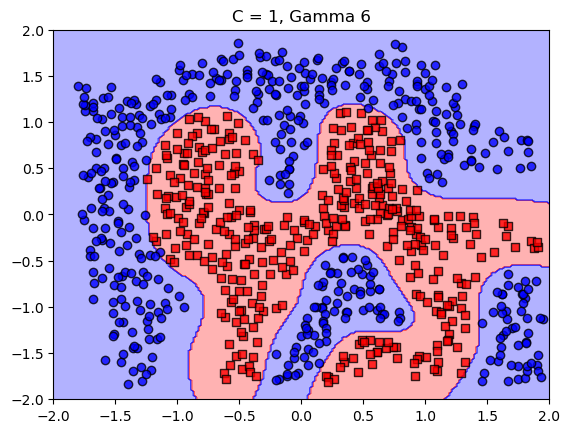

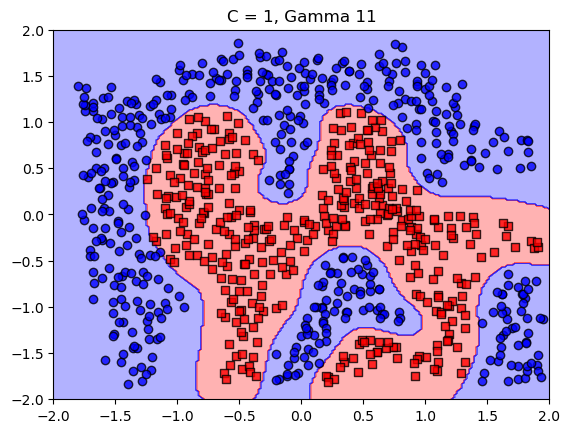

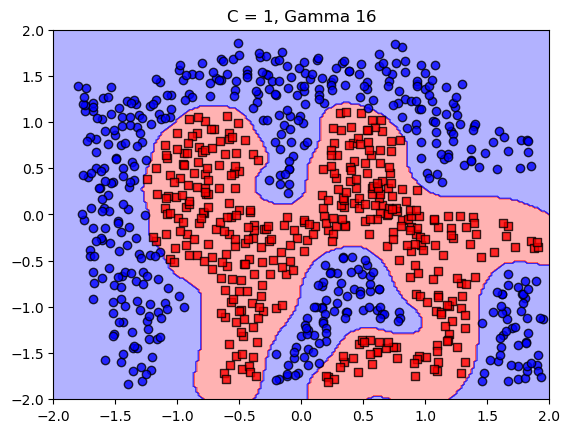

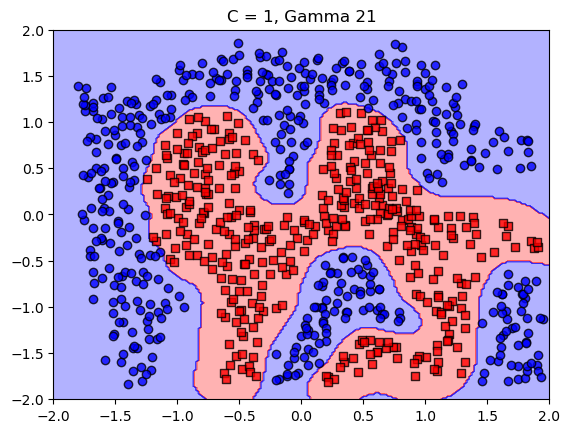

...

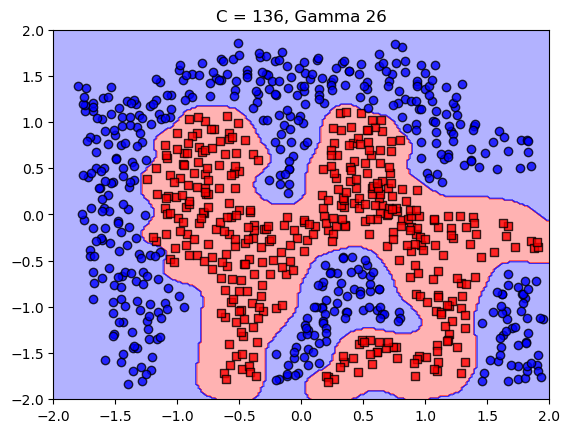

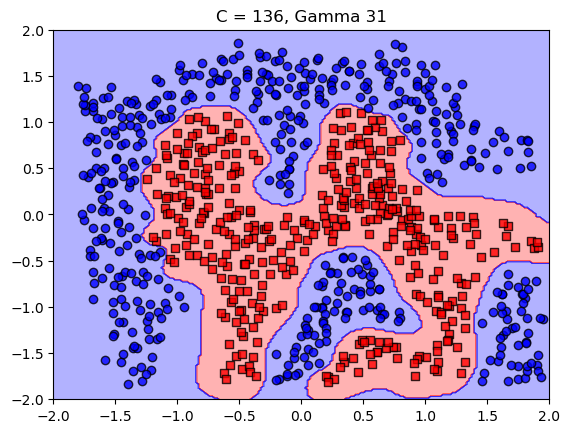

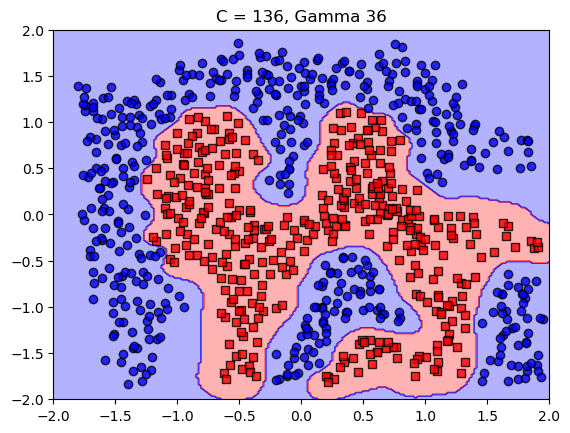

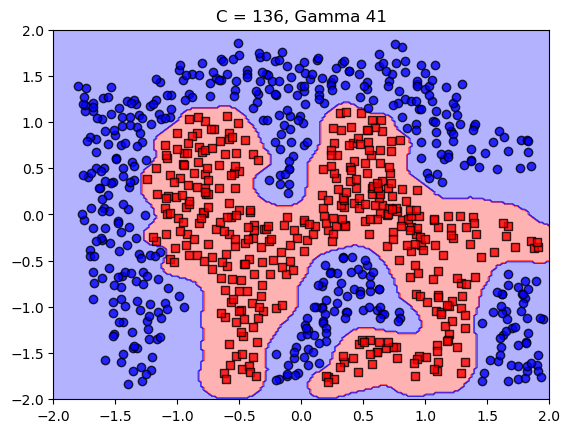

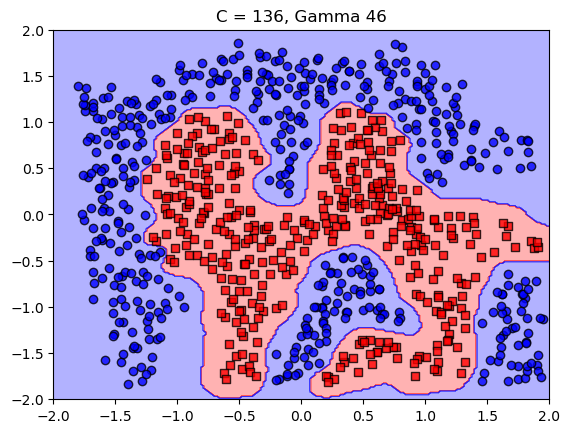

In [ ]:
#------------------------------------------------------
gammas = np.arange(1, 50, 5)
scores2 = []
for i in c:
    for j in gammas:
        svm2 = SVC(C=i, gamma=j, kernel='rbf')
        svm2.fit(X_2_std, y_2)
        y_svc2 = svm2.predict(X_2_std)
        scores2.append(f"Para C = {i}, Gamma = {j}, R² = {r2_score(y_2, y_svc2)}")
        plot_decision_regions(X_2_std, y_2, clasificador=svm2)
        plt.title(f"C = {i}, Gamma {j}")
        plt.xlim(-2,2)
        plt.ylim(-2,2)
        plt.show()
#------------------------------------------------------

In [ ]:
for sc in scores2:
    print(sc)

Para C = 1, Gamma = 1, R² = 0.7699793298520452
Para C = 1, Gamma = 6, R² = 0.9859171018276762
Para C = 1, Gamma = 11, R² = 1.0
Para C = 1, Gamma = 16, R² = 1.0
Para C = 1, Gamma = 21, R² = 1.0
Para C = 1, Gamma = 26, R² = 1.0
Para C = 1, Gamma = 31, R² = 1.0
Para C = 1, Gamma = 36, R² = 1.0
Para C = 1, Gamma = 41, R² = 1.0
Para C = 1, Gamma = 46, R² = 1.0
Para C = 16, Gamma = 1, R² = 0.9624456048738033
Para C = 16, Gamma = 6, R² = 0.9953057006092254
Para C = 16, Gamma = 11, R² = 0.9953057006092254
Para C = 16, Gamma = 16, R² = 1.0
Para C = 16, Gamma = 21, R² = 1.0
Para C = 16, Gamma = 26, R² = 1.0
Para C = 16, Gamma = 31, R² = 1.0
Para C = 16, Gamma = 36, R² = 1.0
Para C = 16, Gamma = 41, R² = 1.0
Para C = 16, Gamma = 46, R² = 1.0
Para C = 31, Gamma = 1, R² = 0.9671399042645779
Para C = 31, Gamma = 6, R² = 0.9953057006092254
Para C = 31, Gamma = 11, R² = 1.0
Para C = 31, Gamma = 16, R² = 1.0
Para C = 31, Gamma = 21, R² = 1.0
Para C = 31, Gamma = 26, R² = 1.0
Para C = 31, Gamma = 31, R²

### Dataset Nº 3
El siguiente dataset _data3.mat_ posee datos para entrenamiento (_X_, _y_) y datos para validación (_X_val_, _y_val_)

In [58]:
# Dataset data2.mat
archivo_mat_3 = sio.loadmat('data/data3.mat')
X_3 = archivo_mat_3['X']
y_3 = archivo_mat_3['y'].flatten()
X_val_3 = archivo_mat_3['Xval']
y_val_3 = archivo_mat_3['yval'].flatten()
print(X_3.shape)
print(X_val_3.shape)

(211, 2)
(200, 2)


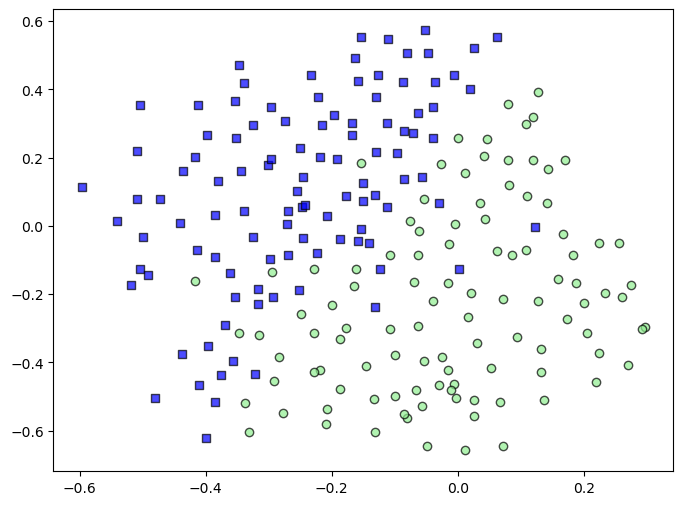

In [59]:
# Visualizamos los datos
markers = ('o', 's', '^', 'v')
colors = ('lightgreen', 'blue', 'salmon','skyblue','red', 'gray', 'cyan')
plt.figure(figsize=(8,6))
for idx, cl in enumerate(np.unique(y_3)):
    plt.scatter(x=X_3[y_3 == cl, 0], 
                y=X_3[y_3 == cl, 1],
                alpha=0.7, 
                c=colors[idx],
                marker=markers[idx], 
                label=cl, 
                edgecolor='black')

In [60]:
sc = StandardScaler()
sc.fit(X_3)                     
X_3_std = sc.transform(X_3)
X_val_3_std = sc.transform(X_val_3)
X_3_std.shape

(211, 2)

Se puede observar que los datos no son linealmente separables. Utilice un modelo con kernel gaussiano y pruebe con distintos valores de C y gamma. 

En esta ocasión, implemente un algoritmo para entrenar modelos con cada uno de los siguientes valores de C y gamma en las listas, calcule el desempeño de cada modelo y guarde esta información en la forma [ (C, gamma), accuracy ]. Su algoritmo debe devolver la combinación (C, gamma) con el máximo valor de accuracy.

In [99]:
valores_C = [0.01, 0.03, 0.1, 0.3, 1, 3, 10, 30]
valores_gamma = [0.01, 0.03, 0.1, 0.3, 1, 3, 10, 30] 
from sklearn.model_selection import cross_val_score

def obtener_mejor_desempeño(valores_C, valores_gamma, X_train, y_train, X_val, y_val):
    rendimientos = []
    #------------------------------------------------------
    for i in valores_C:
        for j in valores_gamma:
            svm = SVC(C=i, gamma=j, kernel='rbf', random_state=1)
            svm.fit(X_train, y_train)
            y_est = svm.predict(X_train)
            rendimientos.append([svm.score(X_val, y_val), (i, j)])
            #rendimientos.append([cross_val_score(svm, X_train, y_train, cv=3), (i, j)])
        
    rendimientos.sort(reverse=True)
    #-----------------------------------------------------
    C = rendimientos[0][1][0]
    gamma = rendimientos[0][1][1]
    return C, gamma

mejorC, mejorGamma = obtener_mejor_desempeño(valores_C, valores_gamma, X_3_std, y_3, X_val_3, y_val_3)
print(f"C= {mejorC}\nGamma= {gamma}")

C= 10
Gamma= 3


In [85]:
#Entreno svm_3 con los parámetros de C y gamma obtenidos
#-----------------------------------------------------
svm_3 = SVC(C=mejorC, gamma=mejorGamma, kernel='rbf')
svm_3.fit(X_3_std, y_3)
#---------------------------------------------------

#calculo el score con los datos de validación
print(svm_3.score(X_val_3_std, y_val_3))

0.93


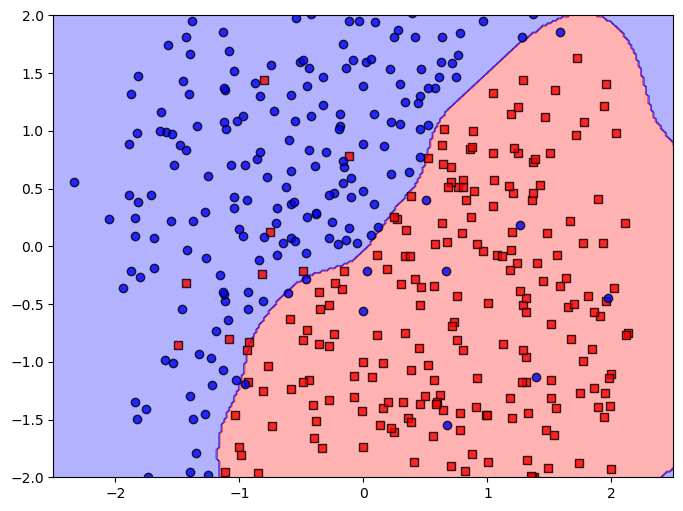

In [80]:
X_combined_std = np.vstack((X_3_std, X_val_3_std))
y_combined = np.hstack((y_3, y_val_3))

plt.figure(figsize=(8,6))
plot_decision_regions(X_combined_std, y_combined, clasificador=svm_3)
plt.xlim(-2.5,2.5)
plt.ylim(-2,2)
plt.show()